# 共同課題
メンバー：安藤、眞野、窪田、（佐藤）、友正  
実施日程：2019年1月12（土）〜18（金）

# 目的
## MVP(Minimum Viable Product)を作ってみる  
● 「実用最低限の製品」と訳される  
● 仮説が正しいか顧客からの反応を得るために使う   
● チームで技術的に可能かの検証という面もある  
● 費用をかけず短期間でMVPを作り、検証を繰り返す  

## 進め方
● プロダクト開発の一連の流れを体験する  
● チームで開発を行う  
● データセットを作成する  

# 課題
「無人レジ」の開発を持ちかけられたと想定し、チームでMVP を作成する。2日毎に中間発表、来週土曜日朝（1/19（土））にはプロダ クトの実演を絡めた最終発表を行う。

# 課題定義
以下の5銘柄のペットボトルをラズパイのカメラで認識して、その銘柄を正しく認識する仕組みを構築することとする。  
この銘柄を選んだ理由は、一般的に知られている銘柄であることと、1組は似た銘柄を含めること（「くちどけもも」「コカコーラピーチ」）。

● 「いろはす」日本コカコーラ　555ml  
● 「コカコーラピーチ」日本コカコーラ　500ml  
● 「お〜いお茶」伊藤園　600ml  
● 「くちどけもも」三ツ矢サイダー　500ml  
● 「ポカリスエット」大塚製薬 500ml  
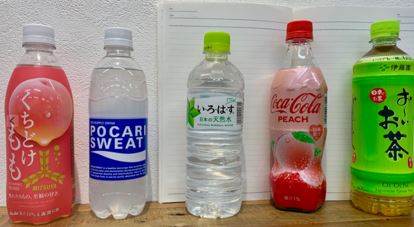

## 前提
5種類の銘柄以外に追加する場合は、今のところもう一度学習し直しを想定している。バッチ学習が前提としています。オンライン学習ができれば理想だと思いますが今回は検討対象外としました。

## 利用イメージ
ラズパイのカメラをセルフレジと想定する。以下の手順の運用を想定する。

①そのカメラから定点の位置に5種類のペットボトルを置く  
②認識開始のトリガーは、ラズパイから繋がっているキーボードキーをクリックする  
③ラズパイが認識したらビープ音が鳴り、ラズパイから繋がっているディスプレイに5銘柄のいずれかが表示される  

## 役割分担
安藤：調査検討／データ作成  
眞野：調査検討／ラズパイ実装／データ検証  
窪田：調査検討／データ作成  
友正：調査検討／データ作成／モデル実装  

# 作業ステップ
①ペットボトル購入／工具購入。渋谷マークシティのfamilymartのセルフレジで実際に購入を行い、挙動を確認。　1/12（土）  
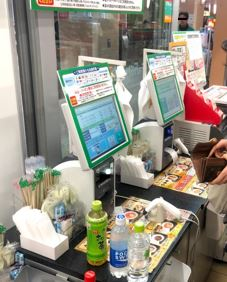
②ラズパイ準備・セットアップ　1/12（土）  
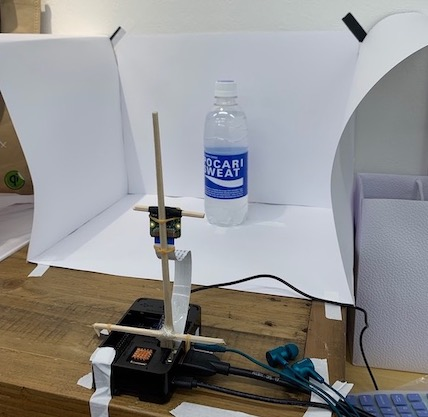
③データ作成　1/13（日）、16（水）、17（木）  

④音声組み込み／ラズパイ用プログラム作成　1/13（日）  

⑤学習済みモデルの作成・検証　1/14（月）～18（金）  

# テストデータ

以下のデータを作成した。  
**＜1商品あたり＞**  
訓練データ    ： 3,000枚（内訳：ランダムデータ2,400枚、キッチリデータ600枚）  
検証データ    ： 1,250枚（内訳：ランダムデータ1,000枚、キッチリデータ250枚）  
テストデータ1 ： 87枚（キッチリ）  
テストデータ2 ： 68枚（バラバラ）  
合計：4,337枚  

**＜5商品＞**  
訓練データ    ： 15,000枚（内訳：ランダムデータ12,000枚、キッチリデータ3,000枚）   
検証データ    ： 6,250枚（内訳：ランダムデータ5,000枚、キッチリデータ1,250枚）   
テストデータ1 ： 435枚（キッチリ）  
テストデータ2 ： 340枚（バラバラ）  
合計：22,025枚  

**＜作成方法＞**  
**キッチリデータ**  
・白ボックスを用意して、1商品当たり30分掛けて手動で回転させて動画を作成して、その動画から静止画を作成（動画参照）。     
・利用したツール：VLCツール（動画再生）  
参考にしたサイト：http://blog.hieroglyph.me/archives/49  
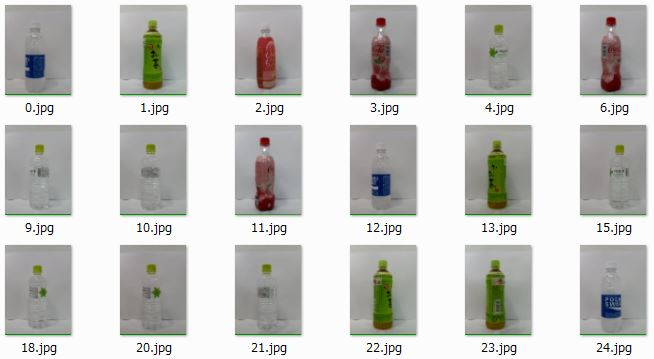


**ランダムデータ**  
様々な角度から商品を動画で作成。その動画から静止画を作成。  
利用したツール：GOM Player
参考にしたサイト：https://www.gomlab.com/download/  
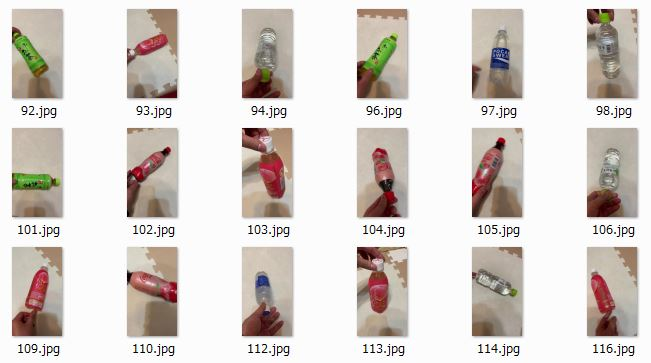

**＜画像データのフォルダ構成＞**  
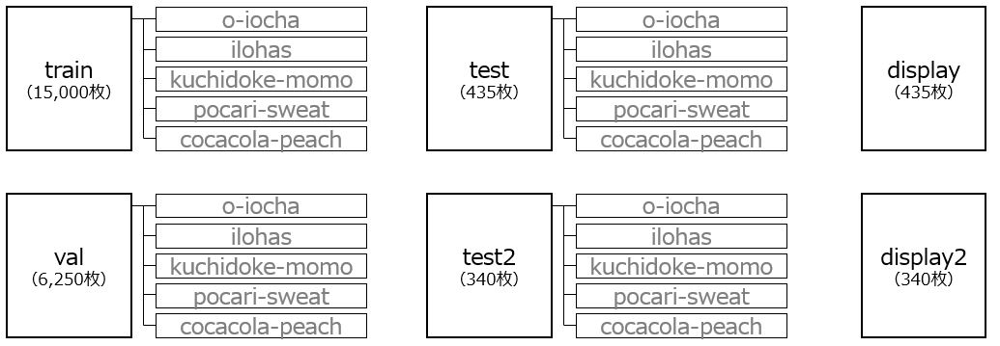


## 画像データの収集作業（参考動画）
テストデータの収集のため、1本のペットボトルを30分間、1回につき、約2度ずつの回転を約500回をカウントしながら、およそ３周させました。これを合計5本分（作業時間2時間30分。休憩込で半日）行いました。見た目、地味で単調に見えますが、微妙な調整力が必要で、正直とても辛い作業でした。最後の方は、腱鞘炎になるかと思うくらいでした。（実際には、土台をモータで回転しながら自動でやることになるかと思いますが・・・）

In [2]:
import IPython.display
IPython.display.VimeoVideo('311607178')

# 学習内容
VGG16、MobileNet、MobileNetの3モデルから転移学習する。  
※MobileNetで学習する前に、VGG16で精度がでるか確認した。 
※入力のShape（224×224）が影響するか確認した。

## 苦労したところ
精度を100％に近づけるところです。「99%出ました！」は一見精度が出ているようですが、無人レジで言えば100商品あたり1商品を誤検知してしまうというとんでも無いシステムになってします。100％でなければいけない無人レジの難易度の高さを感じました。どうしても確率的要素が発生してしまう画像認識技術を無人レジに展開しているであろうAmazonGOやJR東日本はどのようにして実装しているのかとても気になります。

## 学習結果まとめ
予想通りVGG16が他のモデルと比べて一番の精度が出ていることがわかった。しかし、このモデルはラズパイには入らない難点がある。容量が小さく、性能も出ているMobileNet（224）がベストだと言える。  

|テスト|VGG16(224)|MobileNet(224)|MobileNet(160)|MobileNetV2(224)|MobileNetV2(160)|
|:--|:--:|:--:|:--:|:--:|:--:|
|Test1（キッチリ）|1.0|0.9875|0.95625|0.99375|0.990625|
|Test2（ランダム）|1.0|0.978125|0.878125|0.96875|0.875|
|h5の容量|121MB|25MB|25MB|41MB|41MB|

## それぞれのモデルの学習曲線
### VGG16 
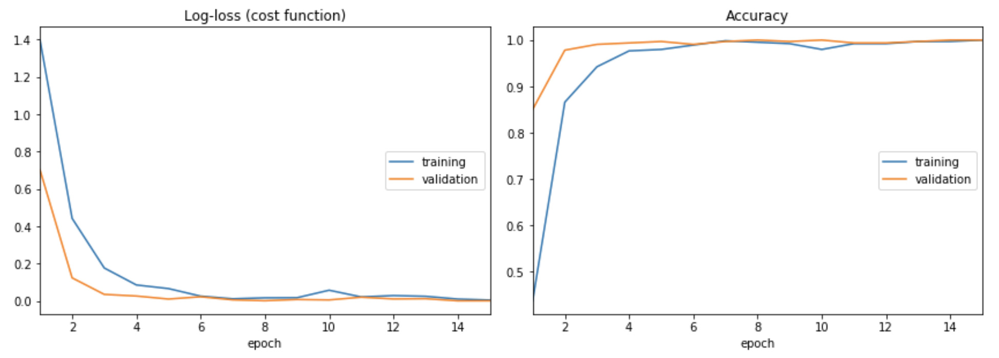

### MobileNet（224） 
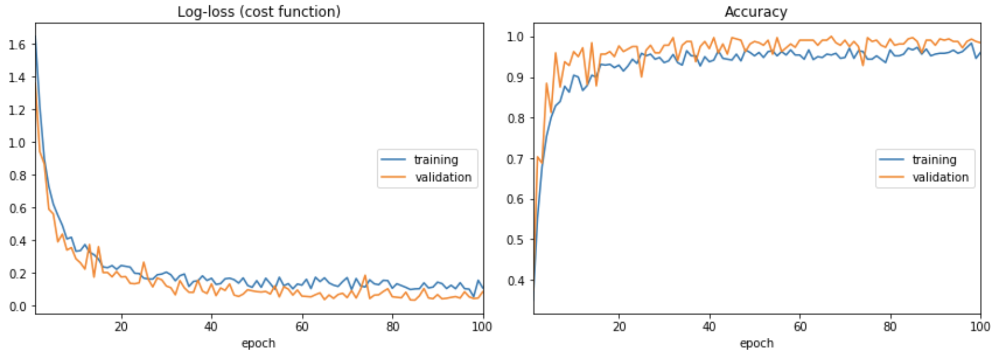

### MobileNet（160） 
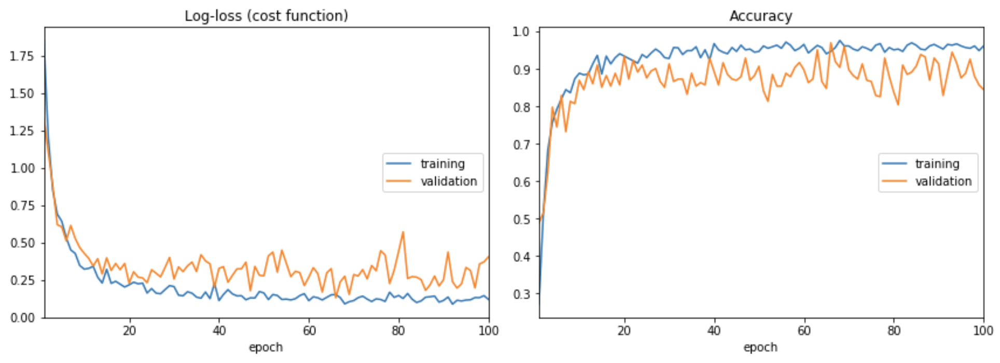

### MobileNetV2（224）
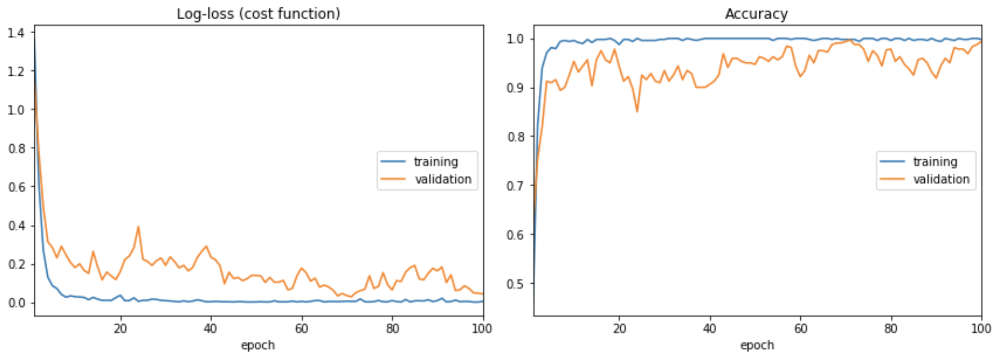

### MobileNetV2（160）
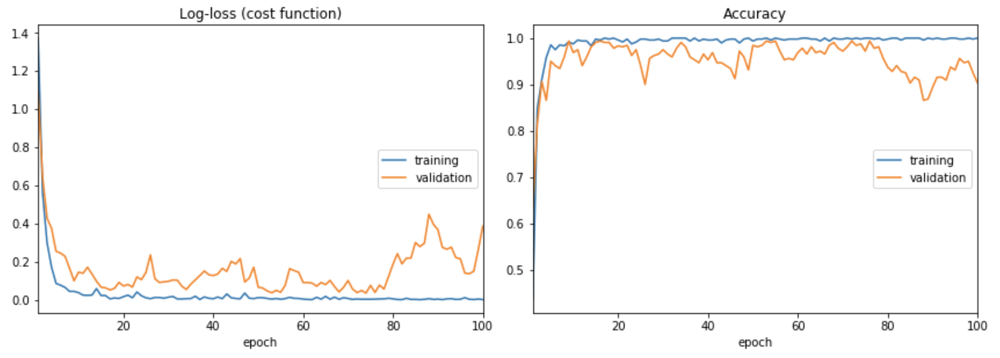

# ラズベリーパイの実装

🔷ラズベリーパイではVGG等の大きいモデルでは動作させる事ができない。そのため、MobileNet でモデル作り、学習済みモデルをラズベリーパイで動くように実装を行った。  

🔷操作フローは以下です。  
①初期化フェーズ(学習済みモデルをロード, 音声生成モジュールの初期化)   
②キーボードからの入力待ち  
③画像取得  
④推論  
 
 
## ラズパイに載せたソースコードは以下

In [ ]:
#!/usr/bin/env python
from keras.preprocessing import image
from keras.models import load_model
from keras.preprocessing.image import img_to_array
import pygame.mixer
import numpy as np
import picamera
from PIL import Image
from time import sleep

# カメラの取得画像保存先
photo_filename = '/tmp/data.jpg'

# カメラから画像を取得し、保存する
def shutter():
    photofile = open(photo_filename, 'wb')
    print(photofile)

    # pi camera 用のライブラリーを使用して、画像を取得
    with picamera.PiCamera() as camera:
        camera.resolution = (300,400)
        camera.start_preview()
        sleep(1.000)
        camera.capture(photofile)

if __name__ == '__main__':
    # モデル+重みを読込み
    self_model = load_model('MobileNet_auto_fine2.h5')
    
    # 音声ファイル初期化
    pygame.mixer.init()
    pygame.mixer.music.load("Cash_Register-Beep01-1.mp3")

    # 正解ラベル
    label = ['cocacola-peach', 'ilohas', 'kuchidoke-momo', 'o-iocha', 'pocari-sweat']
    # 商品価格
    money = {'cocacola-peach':110, 'ilohas':120, 'kuchidoke-momo':130, 'o-iocha':140, 'pocari-sweat':150}

    while True:
        money_sum = 0 
        key = input('商品をスキャンする場合は「Enter」を押して下さい')
        while True:
            # 画像の取得
            shutter()

            # 音声再生
            pygame.mixer.music.play(1)
            sleep(1)
            # 再生の終了
            pygame.mixer.music.stop()

            # 画像をモデルの入力用に加工
            img = Image.open(photo_filename)
            img = img.resize((224, 224))
            img_array = img_to_array(img)
            img_array = img_array.astype('float32')/255.0
            img_array = img_array.reshape((1,224,224,3))
            
            # predict
            img_pred = self_model.predict(img_array)
            name = label[np.argmax(img_pred)]
            print(name)
            money_sum += money[name]
            print("小計:{}円".format(money_sum))
            key = input('続けて商品をスキャンする場合は「y + Enter」,会計する場合は「Enter」を押して下さい')
            if key != 'y':
                print("合計:{}円".format(money_sum))
                break

# 検証結果
ほぼ正解している。以下にラズパイで取得した画像とコンソールの表示画像を示す。

## コーソール画面 	
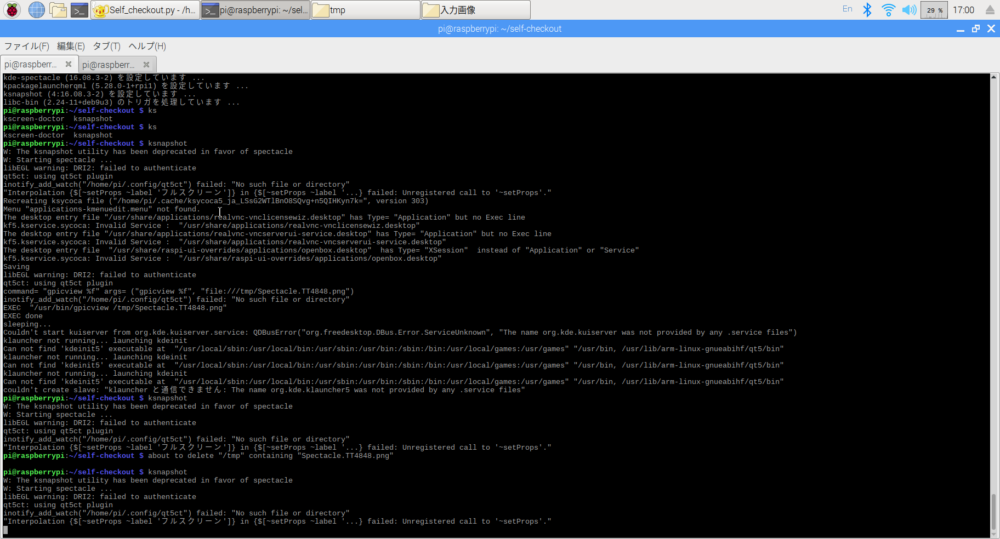

## ラズパイの取得画像
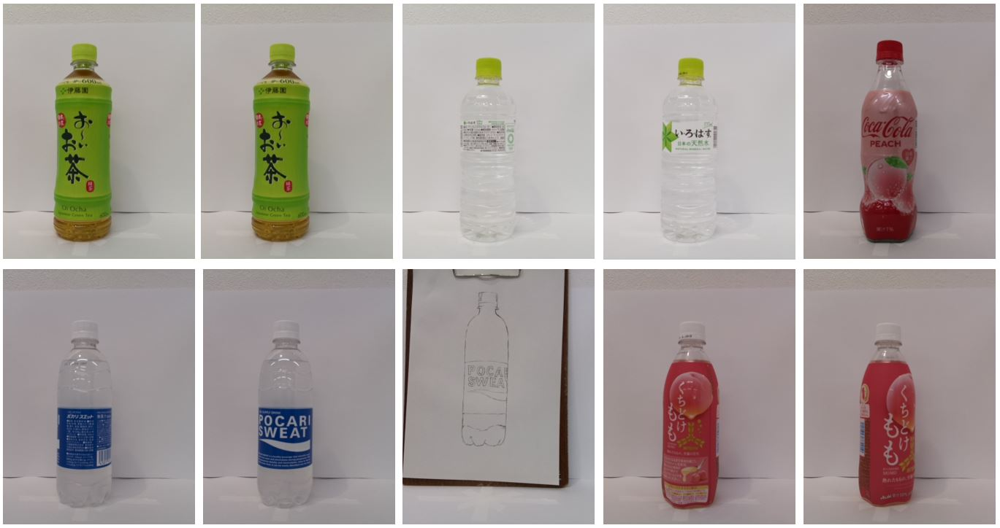

## モデルが見ているところの考察
今回作成したモデルがどこを見ているか検討すべく、学習していない物で推論を行った。結果以下の傾向があることが確認できた。<br>
- ラベルを剥がした場合<br>
ペットボトルの形で判断をしており、「コカコーラピーチ」や「おーいお茶」などの形が違うものは認識ができた。しかし、「くちどけ」の場合は「おーいお茶」と認識した。また、同じメーカの商品で形が似ているものは人間の目から見ても一番似ているものを認識した。<br>

- ラベルのみ <br>
全てのラベルで正しく認識することができた。また、ラベルの形やデザインが似ているものはやはり、一番似ていると認識した。<br>

- デザイン<br>
「くちどけ」と「コカコーラピーチ」に「桃」のデザインが入っている。この桃のデザインは丸に近いデザインとなっている。そのため、丸いデザインが入っている冊子を認識させたところ「くちどけ」や「コカコーラピーチ」となった。結果が異なったのは冊子を置いた向きや角度によって異なった。<br>
また、ガムのボトルでも試した。ガムのボトルを立てた状態で「おーいお茶」と認識した。ボトルのデザインが緑であり、ボトルのデザインに凹凸がないためだと思われる。今度は、ボトルを横に寝かし蓋の正面をカメラに向けると「くちどけ」と認識した。

- 色<br>
全ての色では試していないが、青、ピンクを試したところ、青は「ポカリスエット」と認識し、ピンクは「くちどけ」や「コカコーラピーチ」と認識した。<br>

以上から結果から、モデルはボトルの形、色、ラベルのデザインを認識していることが確認できた。このことから、同じメーカの商品でフレーバーが異なるような商品の場合はボトルの形、デザインが似ているため、誤認識しやすいと考えられる。テストする際には、類似品同士が結果を比べ、誤認識する傾向を調べる必要がある。

# やり残したことや今後に向けて
・MobileNetとVGG16でなぜ精度が異なるのか、パラメータ数の違いなどの原因をもう少し調査したい。  
・新たに商品が追加された時の対応として、バッチ学習（一括学習）ではなく、オンライン学習（逐次学習）であればどのように実装するべきか検討する。  

# ----------------以下は学習記録----------------

# 学習結果サマリ

## VGG16（224×224）
**Log-loss (cost function):**  
training   (min:    0.005, max:    1.397, cur:    0.005)  
validation (min:    0.001, max:    0.702, cur:    0.001)  

**Accuracy:**  
training   (min:    0.436, max:    1.000, cur:    1.000)  
validation (min:    0.850, max:    1.000, cur:    1.000) 


**Predict（test1）**  
 test loss: 3.881290031131357e-05  
 test_acc: 1.0  

**Predict（test2）**  
 test loss: 0.0034616337517945793  
 test_acc: 1.0   
 
 ## MobileNet（224×224）
**Log-loss (cost function):**  
training   (min:    0.054, max:    1.645, cur:    0.108)  
validation (min:    0.032, max:    1.358, cur:    0.083)  

**Accuracy:**  
training   (min:    0.350, max:    0.983, cur:    0.960)  
validation (min:    0.375, max:    1.000, cur:    0.984)  

**Predict（test1）**   
 test loss: 0.06109768375754356  
 test_acc: 0.9875  

**Predict（test2）**   
 test loss: 0.06645064856857061  
 test_acc: 0.978125  
 
 ## MobileNet（160×160）
**Log-loss (cost function):**  
training   (min:    0.088, max:    1.850, cur:    0.119)  
validation (min:    0.131, max:    1.329, cur:    0.404)  

**Accuracy:**  
training   (min:    0.271, max:    0.975, cur:    0.960)  
validation (min:    0.487, max:    0.969, cur:    0.844)  

**Predict（test1）**   
 test loss: 0.1379891701042652   
 test_acc: 0.95625   

**Predict（test2）**   
 test loss: 0.3826994106173515   
 test_acc: 0.878125   
 
 ## MobileNetV2（224×224）
**Log-loss (cost function):**  
training   (min:    0.000, max:    1.368, cur:    0.004)  
validation (min:    0.028, max:    1.159, cur:    0.042)  

**Accuracy:**  
training   (min:    0.460, max:    1.000, cur:    0.998)  
validation (min:    0.619, max:    0.997, cur:    0.994)  

**Predict（test1）**  
 test loss: 0.0463521271944046  
 test_acc: 0.99375  

**Predict（test2）**   
 test loss: 0.08764868583530187  
 test_acc: 0.96875  

## MobileNetV2（160×160）
**Log-loss (cost function):**  
training   (min:    0.001, max:    1.370, cur:    0.001)   
validation (min:    0.035, max:    1.086, cur:    0.385)   

**Accuracy:**  
training   (min:    0.435, max:    1.000, cur:    1.000)   
validation (min:    0.631, max:    0.994, cur:    0.903)   

**Predict（test1）**  
 test loss: 0.0448226616717875   
 test_acc: 0.990625   

**Predict（test2）**  
 test loss: 0.4968989446759224   
 test_acc: 0.875

# VGG16（224×224）

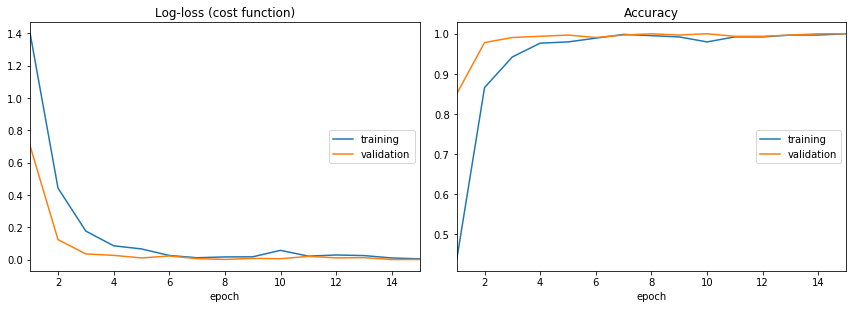

Log-loss (cost function):
training   (min:    0.005, max:    1.397, cur:    0.005)
validation (min:    0.001, max:    0.702, cur:    0.001)

Accuracy:
training   (min:    0.436, max:    1.000, cur:    1.000)
validation (min:    0.850, max:    1.000, cur:    1.000)


In [1]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D,Input,Dropout
from keras.applications.mobilenet import MobileNet
from keras.applications.vgg16 import VGG16
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.callbacks import CSVLogger,EarlyStopping
from livelossplot.keras import PlotLossesCallback
%matplotlib inline

n_categories=5
batch_size=32
train_dir = './images/train'
validation_dir = './images/val'
file_name='VGG16_shape224'

base_model=VGG16(input_shape=(224,224,3),
                 weights='imagenet',
                 include_top=False,)

#add new layers instead of FC networks
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dropout(0.5)(x)
x=Dense(1024,activation='relu')(x)
prediction=Dense(n_categories,activation='softmax')(x)
model=Model(inputs=base_model.input,outputs=prediction)

#fix weights before MobileNet
for layer in base_model.layers[:15]:
    layer.trainable=False

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

#save model
train_datagen=ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    rescale=1.0/255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

validation_datagen=ImageDataGenerator(rescale=1.0/255)

train_generator=train_datagen.flow_from_directory(
    train_dir,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

validation_generator=validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

hist=model.fit_generator(train_generator,
                         steps_per_epoch=20,
                         epochs=15,
                         verbose=1,
                         validation_data=validation_generator,
                         validation_steps=10,
                         callbacks=[EarlyStopping(patience=10),PlotLossesCallback()])

#save weights
model.save(file_name+'.h5')

Found 435 images belonging to 5 classes.

 test loss: 3.881290031131357e-05

 test_acc: 1.0
img_pred     :     0     [[ 0  0  0 99  0]]
img_pred     :     1     [[  0   0 100   0   0]]
img_pred     :     2     [[99  0  0  0  0]]
img_pred     :     3     [[99  0  0  0  0]]
img_pred     :     4     [[ 0  0 99  0  0]]
img_pred     :     5     [[ 0  0 99  0  0]]
img_pred     :     6     [[ 0  0  0  0 99]]
img_pred     :     7     [[ 0 99  0  0  0]]
img_pred     :     8     [[99  0  0  0  0]]
img_pred     :     9     [[ 0 99  0  0  0]]
img_pred     :     10     [[  0   0   0 100   0]]
img_pred     :     11     [[ 0  0 99  0  0]]
img_pred     :     12     [[ 0 99  0  0  0]]
img_pred     :     13     [[ 0  0 99  0  0]]
img_pred     :     14     [[99  0  0  0  0]]
img_pred     :     15     [[  0   0 100   0   0]]
img_pred     :     16     [[  0   0 100   0   0]]
img_pred     :     17     [[ 0  0  0  0 99]]
img_pred     :     18     [[ 0  0 99  0  0]]
img_pred     :     19     [[ 0  0 99  0  0]

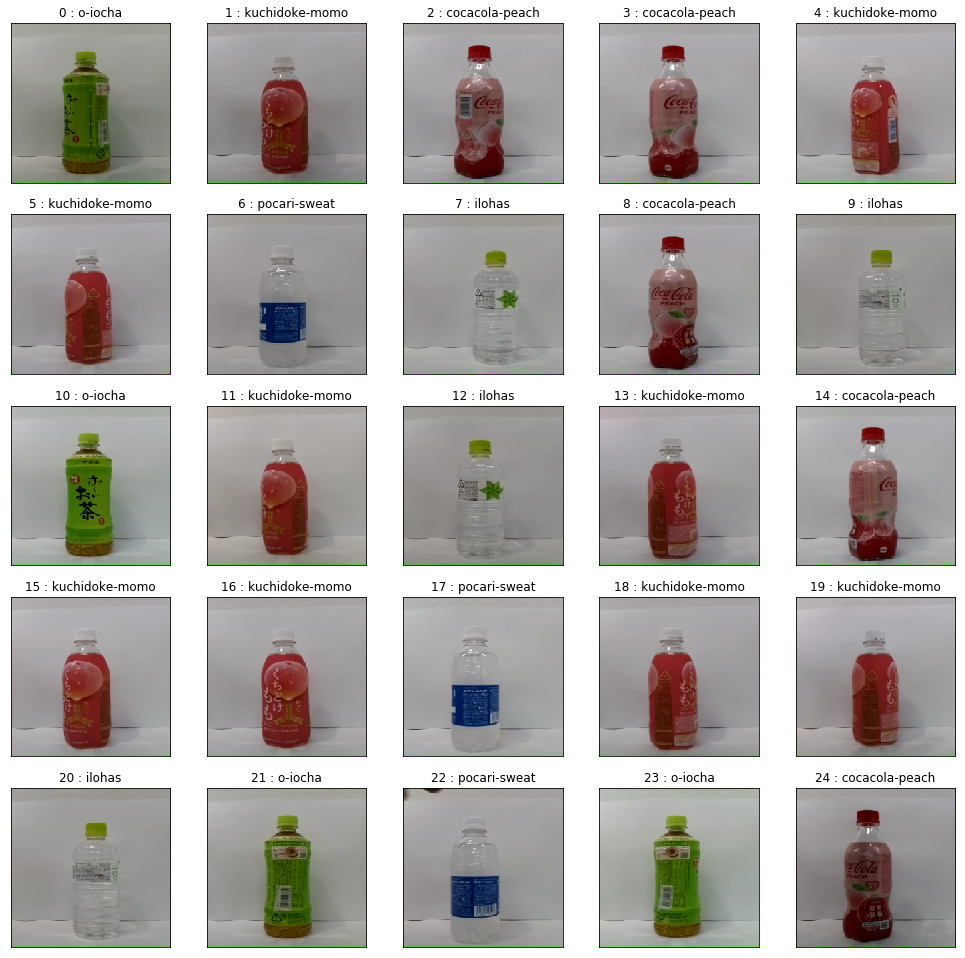

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os,random
from keras.preprocessing.image import img_to_array, load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.models import load_model
%matplotlib inline

batch_size=32
file_name='VGG16_shape224'
test_dir = './images/test'
display_dir = './images/display'
label = ['cocacola-peach', 'ilohas', 'kuchidoke-momo','o-iocha','pocari-sweat']

#load model and weights
model = load_model(file_name+'.h5')

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#data generate
test_datagen=ImageDataGenerator(rescale=1.0/255)

test_generator=test_datagen.flow_from_directory(
    test_dir,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

#evaluate model
score = model.evaluate_generator(test_generator, steps=10)
print('\n test loss:',score[0])
print('\n test_acc:',score[1])

#predict model and display images
files=os.listdir(display_dir)
img=random.sample(files,25)

plt.figure(figsize=(17,17))
for i in range(25):
    temp_img=load_img(os.path.join(display_dir,img[i]),target_size=(224,224))
    plt.subplot(5,5,i+1)
    plt.imshow(temp_img)
    #Images normalization
    temp_img_array=img_to_array(temp_img)
    temp_img_array=temp_img_array.astype('float32')/255.0
    temp_img_array=temp_img_array.reshape((1,224,224,3))
    #predict image
    img_pred=model.predict(temp_img_array)
    print('img_pred     :    ', i,'   ',(img_pred*100).astype(np.int))
    plt.title(str(i)+' : '+label[np.argmax(img_pred)])
    #eliminate xticks,yticks
    plt.xticks([]),plt.yticks([])

plt.show()

Found 340 images belonging to 5 classes.

 test loss: 0.0034616337517945793

 test_acc: 1.0
img_pred     :     0     [[ 0 99  0  0  0]]
img_pred     :     1     [[ 0  0 99  0  0]]
img_pred     :     2     [[  0   0   0 100   0]]
img_pred     :     3     [[99  0  0  0  0]]
img_pred     :     4     [[ 0  0  0  0 99]]
img_pred     :     5     [[  0   0   0 100   0]]
img_pred     :     6     [[100   0   0   0   0]]
img_pred     :     7     [[99  0  0  0  0]]
img_pred     :     8     [[  0   0   0 100   0]]
img_pred     :     9     [[99  0  0  0  0]]
img_pred     :     10     [[  0   0   0   0 100]]
img_pred     :     11     [[  0   0   0 100   0]]
img_pred     :     12     [[  0   0   0 100   0]]
img_pred     :     13     [[ 0 99  0  0  0]]
img_pred     :     14     [[ 0  0 99  0  0]]
img_pred     :     15     [[  0   0 100   0   0]]
img_pred     :     16     [[ 0  0  0  0 99]]
img_pred     :     17     [[  0   0   0 100   0]]
img_pred     :     18     [[  0   0   0 100   0]]
img_pred     

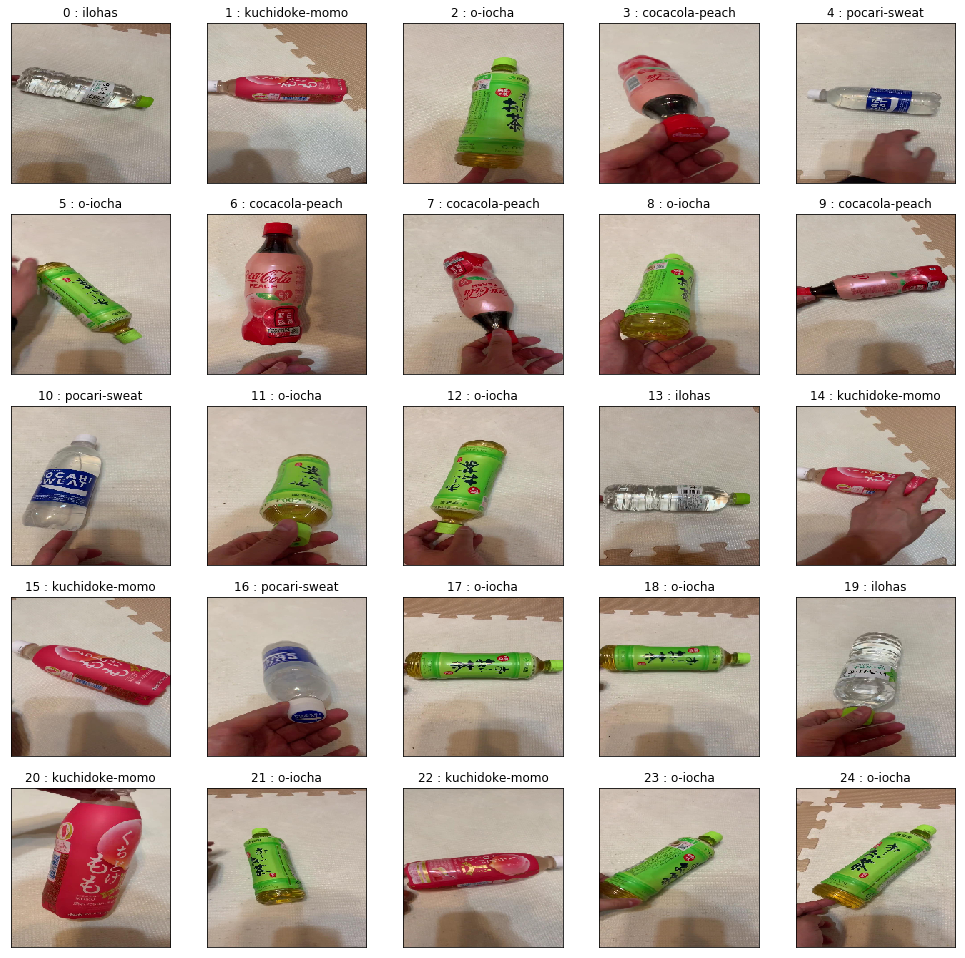

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import os,random
from keras.preprocessing.image import img_to_array, load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import SGD,Adam
from keras.models import load_model
%matplotlib inline

batch_size=32
file_name='VGG16_shape224'
test_dir = './images/test2'
display_dir = './images/display2'
label = ['cocacola-peach', 'ilohas', 'kuchidoke-momo','o-iocha','pocari-sweat']

#load model and weights
model = load_model(file_name+'.h5')

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#data generate
test_datagen=ImageDataGenerator(rescale=1.0/255)

test_generator=test_datagen.flow_from_directory(
    test_dir,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

#evaluate model
score = model.evaluate_generator(test_generator, steps=10)
print('\n test loss:',score[0])
print('\n test_acc:',score[1])

#predict model and display images
files=os.listdir(display_dir)
img=random.sample(files,25)

plt.figure(figsize=(17,17))
for i in range(25):
    temp_img=load_img(os.path.join(display_dir,img[i]),target_size=(224,224))
    plt.subplot(5,5,i+1)
    plt.imshow(temp_img)
    #Images normalization
    temp_img_array=img_to_array(temp_img)
    temp_img_array=temp_img_array.astype('float32')/255.0
    temp_img_array=temp_img_array.reshape((1,224,224,3))
    #predict image
    img_pred=model.predict(temp_img_array)
    print('img_pred     :    ', i,'   ',(img_pred*100).astype(np.int))
    plt.title(str(i)+' : '+label[np.argmax(img_pred)])
    #eliminate xticks,yticks
    plt.xticks([]),plt.yticks([])

plt.show()

# MobileNetV1（224×224）

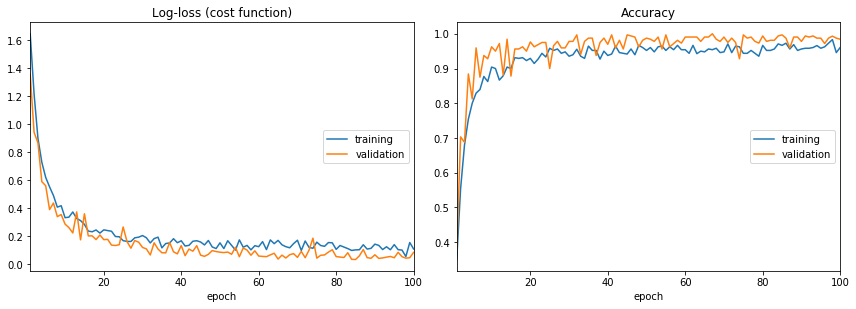

Log-loss (cost function):
training   (min:    0.054, max:    1.645, cur:    0.108)
validation (min:    0.032, max:    1.358, cur:    0.083)

Accuracy:
training   (min:    0.350, max:    0.983, cur:    0.960)
validation (min:    0.375, max:    1.000, cur:    0.984)


In [1]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D,Input,Dropout
from keras.applications.mobilenet import MobileNet
from keras.applications.vgg16 import VGG16
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.callbacks import CSVLogger,EarlyStopping
from livelossplot.keras import PlotLossesCallback
%matplotlib inline

n_categories=5
batch_size=32
train_dir = './images/train'
validation_dir = './images/val'
file_name='MobileNet_shape224'

base_model=MobileNet(input_shape=(224,224,3),
                     weights='imagenet',
                     include_top=False
                     #dropout=0.1
                    )

#add new layers instead of FC networks
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dropout(0.5)(x)
x=Dense(1024,activation='relu')(x)
prediction=Dense(n_categories,activation='softmax')(x)
model=Model(inputs=base_model.input,outputs=prediction)

#fix weights before MobileNet
for layer in base_model.layers[:85]:
    layer.trainable=False

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

#save model
train_datagen=ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    rescale=1.0/255,
    shear_range=0.2,
    zoom_range=0.2,
    vertical_flip=True,
    horizontal_flip=True)

validation_datagen=ImageDataGenerator(rescale=1.0/255)

train_generator=train_datagen.flow_from_directory(
    train_dir,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

validation_generator=validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

hist=model.fit_generator(train_generator,
                         steps_per_epoch=15,
                         epochs=100,
                         verbose=1,
                         validation_data=validation_generator,
                         validation_steps=10,
                         #callbacks=[EarlyStopping(patience=20),PlotLossesCallback()]
                         callbacks=[PlotLossesCallback()]
                        )

#save weights
model.save(file_name+'.h5')

Found 435 images belonging to 5 classes.

 test loss: 0.06109768375754356

 test_acc: 0.9875
img_pred     :     0     [[ 0 77  1  0 20]]
img_pred     :     1     [[ 0  0 99  0  0]]
img_pred     :     2     [[ 0  0 99  0  0]]
img_pred     :     3     [[ 0 86  0  1 11]]
img_pred     :     4     [[ 0  0  5 94  0]]
img_pred     :     5     [[ 0  0 99  0  0]]
img_pred     :     6     [[ 0  0 99  0  0]]
img_pred     :     7     [[92  0  7  0  0]]
img_pred     :     8     [[97  0  2  0  0]]
img_pred     :     9     [[ 0  0  0 99  0]]
img_pred     :     10     [[59  0 38  0  1]]
img_pred     :     11     [[ 0  0 99  0  0]]
img_pred     :     12     [[ 0  0  0  0 99]]
img_pred     :     13     [[99  0  0  0  0]]
img_pred     :     14     [[57  0 41  0  0]]
img_pred     :     15     [[ 0 87  0  0 10]]
img_pred     :     16     [[ 0  0  0 99  0]]
img_pred     :     17     [[ 0 63  6  1 28]]
img_pred     :     18     [[ 0 96  0  0  3]]
img_pred     :     19     [[ 0  0  0  0 99]]
img_pred     :   

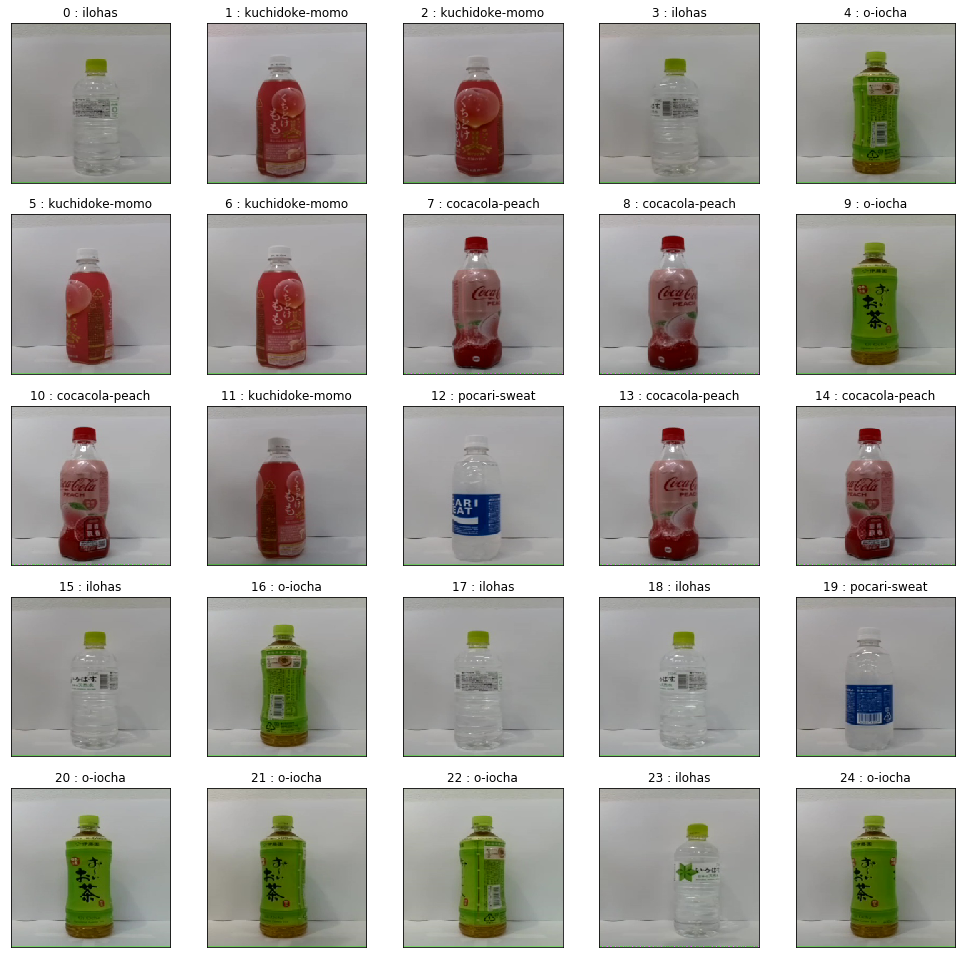

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os,random
from keras.preprocessing.image import img_to_array, load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.models import load_model
%matplotlib inline

batch_size=32
file_name='MobileNet_shape224'
test_dir = './images/test'
display_dir = './images/display'
label = ['cocacola-peach', 'ilohas', 'kuchidoke-momo','o-iocha','pocari-sweat']

#load model and weights
model = load_model(file_name+'.h5')

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#data generate
test_datagen=ImageDataGenerator(rescale=1.0/255)

test_generator=test_datagen.flow_from_directory(
    test_dir,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

#evaluate model
score = model.evaluate_generator(test_generator, steps=10)
print('\n test loss:',score[0])
print('\n test_acc:',score[1])

#predict model and display images
files=os.listdir(display_dir)
img=random.sample(files,25)

plt.figure(figsize=(17,17))
for i in range(25):
    temp_img=load_img(os.path.join(display_dir,img[i]),target_size=(224,224))
    plt.subplot(5,5,i+1)
    plt.imshow(temp_img)
    #Images normalization
    temp_img_array=img_to_array(temp_img)
    temp_img_array=temp_img_array.astype('float32')/255.0
    temp_img_array=temp_img_array.reshape((1,224,224,3))
    #predict image
    img_pred=model.predict(temp_img_array)
    print('img_pred     :    ', i,'   ',(img_pred*100).astype(np.int))
    plt.title(str(i)+' : '+label[np.argmax(img_pred)])
    #eliminate xticks,yticks
    plt.xticks([]),plt.yticks([])

plt.show()

Found 340 images belonging to 5 classes.

 test loss: 0.06645064856857061

 test_acc: 0.978125
img_pred     :     0     [[ 0  0 99  0  0]]
img_pred     :     1     [[ 0 99  0  0  0]]
img_pred     :     2     [[ 0  0  1 98  0]]
img_pred     :     3     [[ 0  0  2 97  0]]
img_pred     :     4     [[95  0  0  0  2]]
img_pred     :     5     [[ 0  0 99  0  0]]
img_pred     :     6     [[ 0  0 99  0  0]]
img_pred     :     7     [[95  0  3  0  0]]
img_pred     :     8     [[ 0  0  0  0 99]]
img_pred     :     9     [[ 0  0 99  0  0]]
img_pred     :     10     [[ 0  0  0 99  0]]
img_pred     :     11     [[99  0  0  0  0]]
img_pred     :     12     [[ 0  0  0 99  0]]
img_pred     :     13     [[ 0  0 99  0  0]]
img_pred     :     14     [[ 0  0 99  0  0]]
img_pred     :     15     [[ 0  1  0 95  1]]
img_pred     :     16     [[ 0  0 99  0  0]]
img_pred     :     17     [[ 0 99  0  0  0]]
img_pred     :     18     [[40  0 44  0 14]]
img_pred     :     19     [[ 0 99  0  0  0]]
img_pred     : 

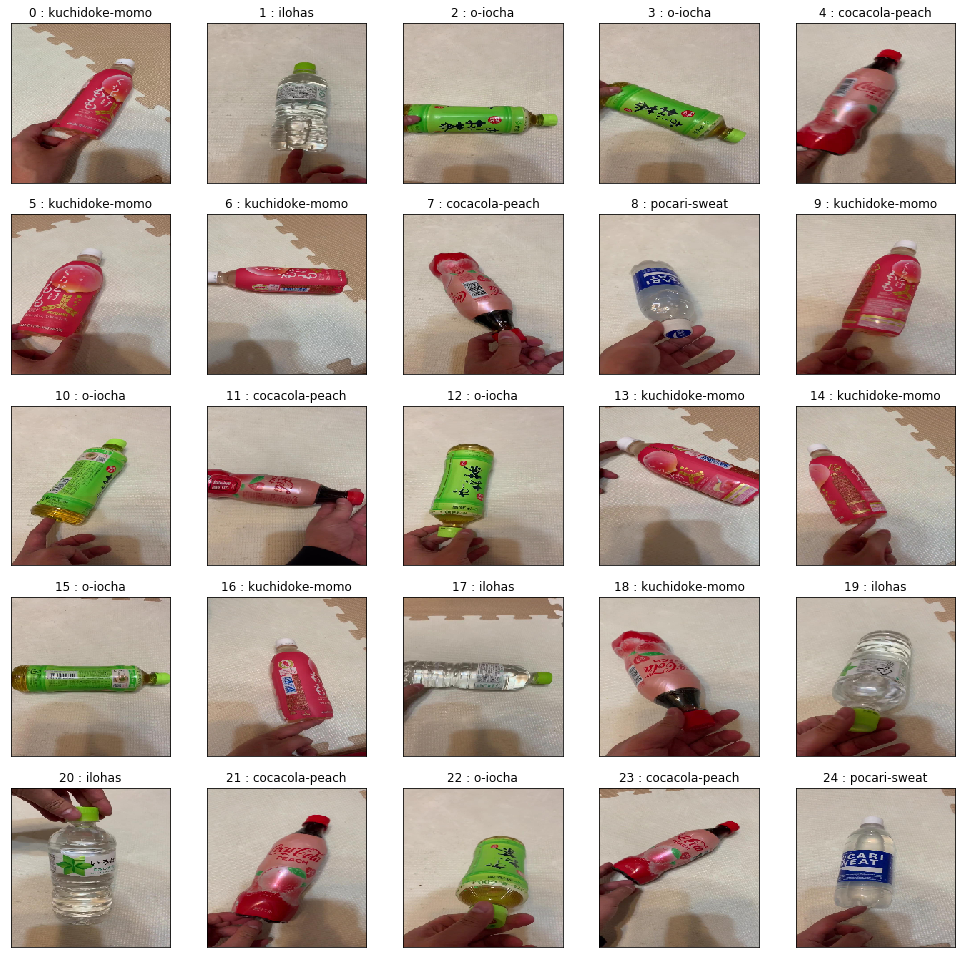

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import os,random
from keras.preprocessing.image import img_to_array, load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.models import load_model
%matplotlib inline

batch_size=32
file_name='MobileNet_shape224'
test_dir = './images/test2'
display_dir = './images/display2'
label = ['cocacola-peach', 'ilohas', 'kuchidoke-momo','o-iocha','pocari-sweat']

#load model and weights
model = load_model(file_name+'.h5')

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#data generate
test_datagen=ImageDataGenerator(rescale=1.0/255)

test_generator=test_datagen.flow_from_directory(
    test_dir,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

#evaluate model
score = model.evaluate_generator(test_generator, steps=10)
print('\n test loss:',score[0])
print('\n test_acc:',score[1])

#predict model and display images
files=os.listdir(display_dir)
img=random.sample(files,25)

plt.figure(figsize=(17,17))
for i in range(25):
    temp_img=load_img(os.path.join(display_dir,img[i]),target_size=(224,224))
    plt.subplot(5,5,i+1)
    plt.imshow(temp_img)
    #Images normalization
    temp_img_array=img_to_array(temp_img)
    temp_img_array=temp_img_array.astype('float32')/255.0
    temp_img_array=temp_img_array.reshape((1,224,224,3))
    #predict image
    img_pred=model.predict(temp_img_array)
    print('img_pred     :    ', i,'   ',(img_pred*100).astype(np.int))
    plt.title(str(i)+' : '+label[np.argmax(img_pred)])
    #eliminate xticks,yticks
    plt.xticks([]),plt.yticks([])

plt.show()

# MobileNet（160×160）

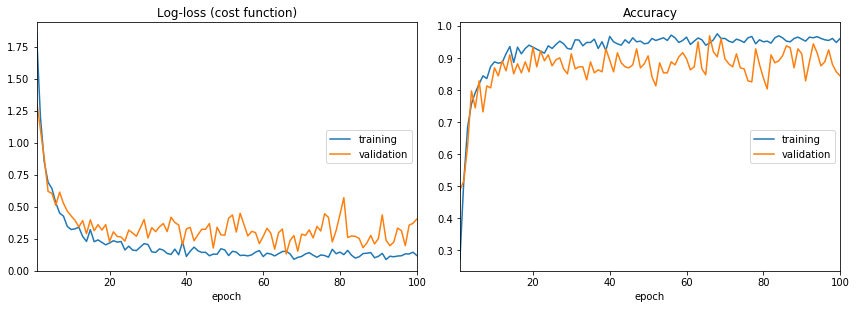

Log-loss (cost function):
training   (min:    0.088, max:    1.850, cur:    0.119)
validation (min:    0.131, max:    1.329, cur:    0.404)

Accuracy:
training   (min:    0.271, max:    0.975, cur:    0.960)
validation (min:    0.487, max:    0.969, cur:    0.844)


In [1]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D,Input,Dropout
from keras.applications.mobilenet import MobileNet
from keras.applications.vgg16 import VGG16
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.callbacks import CSVLogger,EarlyStopping
from livelossplot.keras import PlotLossesCallback
%matplotlib inline

n_categories=5
batch_size=32
train_dir = './images/train'
validation_dir = './images/val'
file_name='MobileNet_shape160'

base_model=MobileNet(input_shape=(160,160,3),
                     weights='imagenet',
                     include_top=False
                     #dropout=0.1
                    )

#add new layers instead of FC networks
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dropout(0.5)(x)
x=Dense(1024,activation='relu')(x)
prediction=Dense(n_categories,activation='softmax')(x)
model=Model(inputs=base_model.input,outputs=prediction)

#fix weights before MobileNet
for layer in base_model.layers[:85]:
    layer.trainable=False

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

#save model
train_datagen=ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    rescale=1.0/255,
    shear_range=0.2,
    zoom_range=0.2,
    vertical_flip=True,
    horizontal_flip=True)

validation_datagen=ImageDataGenerator(rescale=1.0/255)

train_generator=train_datagen.flow_from_directory(
    train_dir,
    target_size=(160,160),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

validation_generator=validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(160,160),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

hist=model.fit_generator(train_generator,
                         steps_per_epoch=15,
                         epochs=100,
                         verbose=1,
                         validation_data=validation_generator,
                         validation_steps=10,
                         #callbacks=[EarlyStopping(patience=20),PlotLossesCallback()]
                         callbacks=[PlotLossesCallback()]
                        )

#save weights
model.save(file_name+'.h5')

Found 435 images belonging to 5 classes.

 test loss: 0.1379891701042652

 test_acc: 0.95625
img_pred     :     0     [[ 0  0  0  0 99]]
img_pred     :     1     [[ 0  0  0 99  0]]
img_pred     :     2     [[ 0 91  0  2  5]]
img_pred     :     3     [[ 1 88  4  2  3]]
img_pred     :     4     [[ 0  0 99  0  0]]
img_pred     :     5     [[ 0  0 98  1  0]]
img_pred     :     6     [[ 0  0  0  0 99]]
img_pred     :     7     [[ 0  0  0 99  0]]
img_pred     :     8     [[ 0  0  0  0 99]]
img_pred     :     9     [[ 0  0 99  0  0]]
img_pred     :     10     [[ 0  0  0 99  0]]
img_pred     :     11     [[96  0  2  0  0]]
img_pred     :     12     [[86  0 11  2  0]]
img_pred     :     13     [[ 1 79  1  1 15]]
img_pred     :     14     [[ 0  0  0 99  0]]
img_pred     :     15     [[ 0  0 99  0  0]]
img_pred     :     16     [[ 0  0 99  0  0]]
img_pred     :     17     [[ 0  0  0 99  0]]
img_pred     :     18     [[ 0 95  0  0  3]]
img_pred     :     19     [[ 0  0  0 99  0]]
img_pred     :   

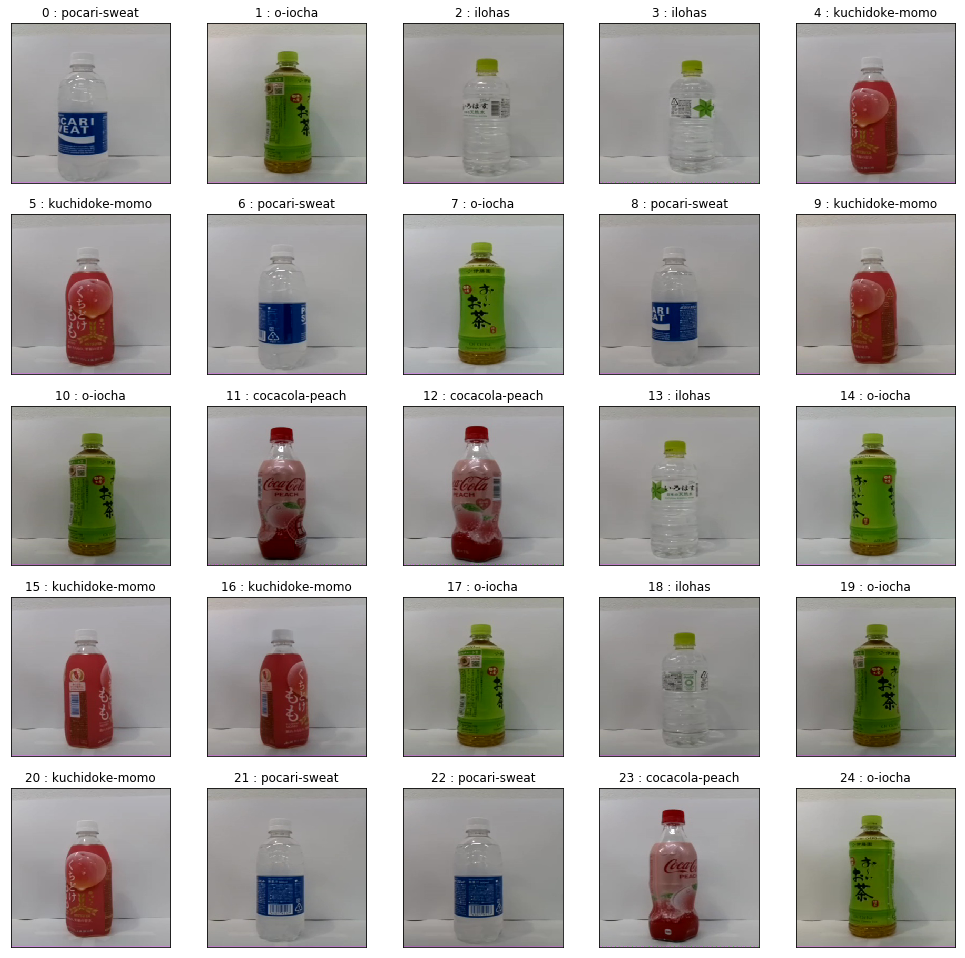

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os,random
from keras.preprocessing.image import img_to_array, load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.models import load_model
%matplotlib inline

batch_size=32
file_name='MobileNet_shape160'
test_dir = './images/test'
display_dir = './images/display'
label = ['cocacola-peach', 'ilohas', 'kuchidoke-momo','o-iocha','pocari-sweat']

#load model and weights
model = load_model(file_name+'.h5')

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#data generate
test_datagen=ImageDataGenerator(rescale=1.0/255)

test_generator=test_datagen.flow_from_directory(
    test_dir,
    target_size=(160,160),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

#evaluate model
score = model.evaluate_generator(test_generator, steps=10)
print('\n test loss:',score[0])
print('\n test_acc:',score[1])

#predict model and display images
files=os.listdir(display_dir)
img=random.sample(files,25)

plt.figure(figsize=(17,17))
for i in range(25):
    temp_img=load_img(os.path.join(display_dir,img[i]),target_size=(160,160))
    plt.subplot(5,5,i+1)
    plt.imshow(temp_img)
    #Images normalization
    temp_img_array=img_to_array(temp_img)
    temp_img_array=temp_img_array.astype('float32')/255.0
    temp_img_array=temp_img_array.reshape((1,160,160,3))
    #predict image
    img_pred=model.predict(temp_img_array)
    print('img_pred     :    ', i,'   ',(img_pred*100).astype(np.int))
    plt.title(str(i)+' : '+label[np.argmax(img_pred)])
    #eliminate xticks,yticks
    plt.xticks([]),plt.yticks([])

plt.show()

Found 340 images belonging to 5 classes.

 test loss: 0.3826994106173515

 test_acc: 0.878125
img_pred     :     0     [[24  0 37  1 36]]
img_pred     :     1     [[ 0  0  0  0 99]]
img_pred     :     2     [[ 0  0 99  0  0]]
img_pred     :     3     [[ 0  0  8 91  0]]
img_pred     :     4     [[ 0 81  0  5 12]]
img_pred     :     5     [[ 8  0  5  3 83]]
img_pred     :     6     [[30  0 68  0  0]]
img_pred     :     7     [[ 0 97  1  0  0]]
img_pred     :     8     [[ 0  0  0  0 99]]
img_pred     :     9     [[ 0  0  0  0 99]]
img_pred     :     10     [[ 0  0  0 99  0]]
img_pred     :     11     [[ 0  0  0  0 99]]
img_pred     :     12     [[20  0 78  0  1]]
img_pred     :     13     [[ 0  0  0  0 99]]
img_pred     :     14     [[ 0 90  0  0  9]]
img_pred     :     15     [[ 0 88  0  2  8]]
img_pred     :     16     [[ 0  0  5 94  0]]
img_pred     :     17     [[ 0  0 99  0  0]]
img_pred     :     18     [[ 0  0  0  0 99]]
img_pred     :     19     [[ 0 96  0  0  3]]
img_pred     :  

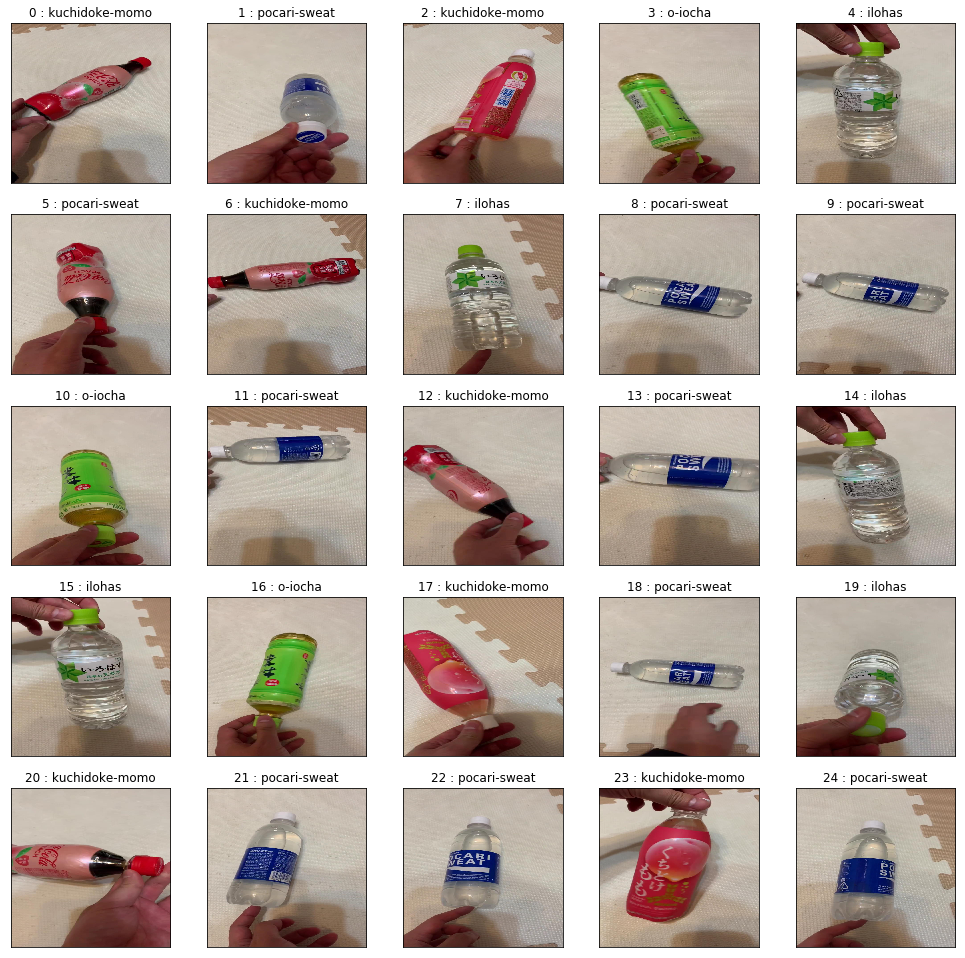

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import os,random
from keras.preprocessing.image import img_to_array, load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.models import load_model
%matplotlib inline

batch_size=32
file_name='MobileNet_shape160'
test_dir = './images/test2'
display_dir = './images/display2'
label = ['cocacola-peach', 'ilohas', 'kuchidoke-momo','o-iocha','pocari-sweat']

#load model and weights
model = load_model(file_name+'.h5')

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#data generate
test_datagen=ImageDataGenerator(rescale=1.0/255)

test_generator=test_datagen.flow_from_directory(
    test_dir,
    target_size=(160,160),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

#evaluate model
score = model.evaluate_generator(test_generator, steps=10)
print('\n test loss:',score[0])
print('\n test_acc:',score[1])

#predict model and display images
files=os.listdir(display_dir)
img=random.sample(files,25)

plt.figure(figsize=(17,17))
for i in range(25):
    temp_img=load_img(os.path.join(display_dir,img[i]),target_size=(160,160))
    plt.subplot(5,5,i+1)
    plt.imshow(temp_img)
    #Images normalization
    temp_img_array=img_to_array(temp_img)
    temp_img_array=temp_img_array.astype('float32')/255.0
    temp_img_array=temp_img_array.reshape((1,160,160,3))
    #predict image
    img_pred=model.predict(temp_img_array)
    print('img_pred     :    ', i,'   ',(img_pred*100).astype(np.int))
    plt.title(str(i)+' : '+label[np.argmax(img_pred)])
    #eliminate xticks,yticks
    plt.xticks([]),plt.yticks([])

plt.show()

# MobileNetV2（224×224）

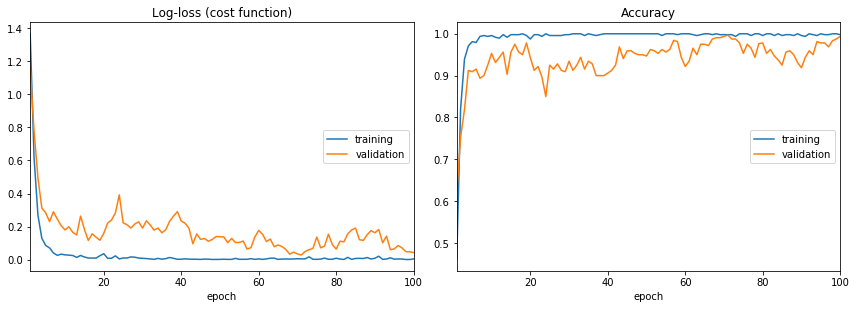

Log-loss (cost function):
training   (min:    0.000, max:    1.368, cur:    0.004)
validation (min:    0.028, max:    1.159, cur:    0.042)

Accuracy:
training   (min:    0.460, max:    1.000, cur:    0.998)
validation (min:    0.619, max:    0.997, cur:    0.994)


In [1]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D,Input,Dropout
from keras.applications.mobilenet import MobileNet
from keras.applications.mobilenetv2 import MobileNetV2
from keras.applications.vgg16 import VGG16
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.callbacks import CSVLogger,EarlyStopping
from livelossplot.keras import PlotLossesCallback
%matplotlib inline

n_categories=5
batch_size=32
train_dir = './images/train'
validation_dir = './images/val'
file_name='MobileNetV2_shape224'

base_model=MobileNetV2(input_shape=(224,224,3),
                       weights='imagenet',
                       include_top=False)

#add new layers instead of FC networks
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dropout(0.5)(x)
x=Dense(1024,activation='relu')(x)
prediction=Dense(n_categories,activation='softmax')(x)
model=Model(inputs=base_model.input,outputs=prediction)

#fix weights before MobileNet
for layer in base_model.layers[:85]:
    layer.trainable=False

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

#save model
train_datagen=ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    rescale=1.0/255,
    shear_range=0.2,
    zoom_range=0.2,
    vertical_flip=True,
    horizontal_flip=True)

validation_datagen=ImageDataGenerator(rescale=1.0/255)

train_generator=train_datagen.flow_from_directory(
    train_dir,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

validation_generator=validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

hist=model.fit_generator(train_generator,
                         steps_per_epoch=15,
                         epochs=100,
                         verbose=1,
                         validation_data=validation_generator,
                         validation_steps=10,
                         #callbacks=[EarlyStopping(patience=2),PlotLossesCallback()]
                         callbacks=[PlotLossesCallback()]
                        )

#save weights
model.save(file_name+'.h5')

Found 435 images belonging to 5 classes.

 test loss: 0.0463521271944046

 test_acc: 0.99375
img_pred     :     0     [[ 0  0  0 99  0]]
img_pred     :     1     [[ 1  0 96  2  0]]
img_pred     :     2     [[ 0  0 99  0  0]]
img_pred     :     3     [[ 0 98  0  1  0]]
img_pred     :     4     [[ 0  0 99  0  0]]
img_pred     :     5     [[ 0  0  0  0 99]]
img_pred     :     6     [[ 0 94  0  5  0]]
img_pred     :     7     [[ 0  0  0 99  0]]
img_pred     :     8     [[ 0 92  0  7  0]]
img_pred     :     9     [[99  0  0  0  0]]
img_pred     :     10     [[ 0  0  0  0 99]]
img_pred     :     11     [[99  0  0  0  0]]
img_pred     :     12     [[99  0  0  0  0]]
img_pred     :     13     [[ 0  0  0 99  0]]
img_pred     :     14     [[99  0  0  0  0]]
img_pred     :     15     [[ 0  0  0  0 98]]
img_pred     :     16     [[ 0 90  0  9  0]]
img_pred     :     17     [[ 0  0  0 99  0]]
img_pred     :     18     [[ 0  0  0  0 98]]
img_pred     :     19     [[ 0 98  0  1  0]]
img_pred     :   

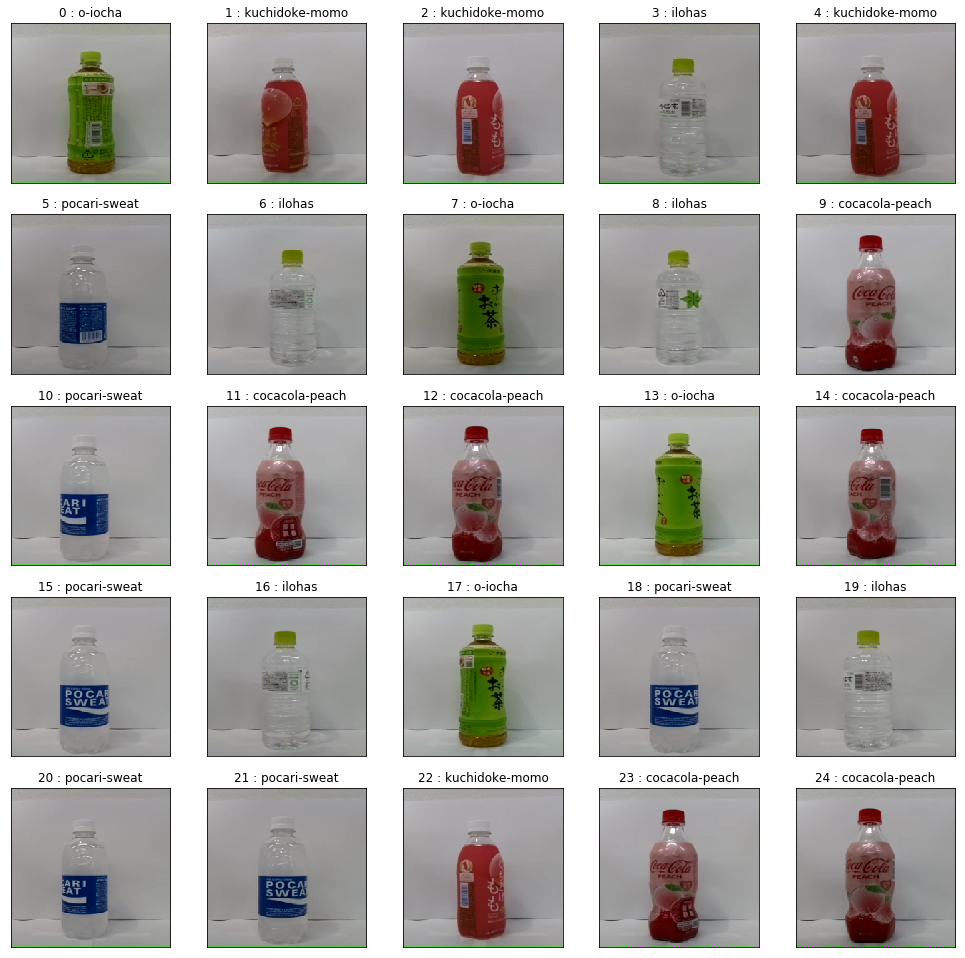

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os,random
from keras.preprocessing.image import img_to_array, load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import SGD,Adam
from keras.models import load_model
%matplotlib inline

batch_size=32
file_name='MobileNetV2_shape224'
test_dir = './images/test'
display_dir = './images/display'
label = ['cocacola-peach', 'ilohas', 'kuchidoke-momo','o-iocha','pocari-sweat']

#load model and weights
model = load_model(file_name+'.h5')

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#data generate
test_datagen=ImageDataGenerator(rescale=1.0/255)

test_generator=test_datagen.flow_from_directory(
    test_dir,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

#evaluate model
score = model.evaluate_generator(test_generator, steps=10)
print('\n test loss:',score[0])
print('\n test_acc:',score[1])

#predict model and display images
files=os.listdir(display_dir)
img=random.sample(files,25)

plt.figure(figsize=(17,17))
for i in range(25):
    temp_img=load_img(os.path.join(display_dir,img[i]),target_size=(224,224))
    plt.subplot(5,5,i+1)
    plt.imshow(temp_img)
    #Images normalization
    temp_img_array=img_to_array(temp_img)
    temp_img_array=temp_img_array.astype('float32')/255.0
    temp_img_array=temp_img_array.reshape((1,224,224,3))
    #predict image
    img_pred=model.predict(temp_img_array)
    print('img_pred     :    ', i,'   ',(img_pred*100).astype(np.int))
    plt.title(str(i)+' : '+label[np.argmax(img_pred)])
    #eliminate xticks,yticks
    plt.xticks([]),plt.yticks([])

plt.show()

Found 340 images belonging to 5 classes.

 test loss: 0.08764868583530187

 test_acc: 0.96875
img_pred     :     0     [[  0   0   0 100   0]]
img_pred     :     1     [[89  0  1  0  8]]
img_pred     :     2     [[ 0  0  0  0 99]]
img_pred     :     3     [[ 0  0 99  0  0]]
img_pred     :     4     [[ 0  0  0 99  0]]
img_pred     :     5     [[ 0  0  0 99  0]]
img_pred     :     6     [[81  0 17  0  0]]
img_pred     :     7     [[  0   0   0 100   0]]
img_pred     :     8     [[ 0  0  0  0 99]]
img_pred     :     9     [[ 0  0 99  0  0]]
img_pred     :     10     [[ 0  0  0  0 99]]
img_pred     :     11     [[ 0  0 99  0  0]]
img_pred     :     12     [[ 0 99  0  0  0]]
img_pred     :     13     [[  0   0   0 100   0]]
img_pred     :     14     [[ 0 99  0  0  0]]
img_pred     :     15     [[ 0 99  0  0  0]]
img_pred     :     16     [[ 0  0 99  0  0]]
img_pred     :     17     [[ 0 99  0  0  0]]
img_pred     :     18     [[ 0  0 12  0 86]]
img_pred     :     19     [[ 0  0  0  0 99]]
i

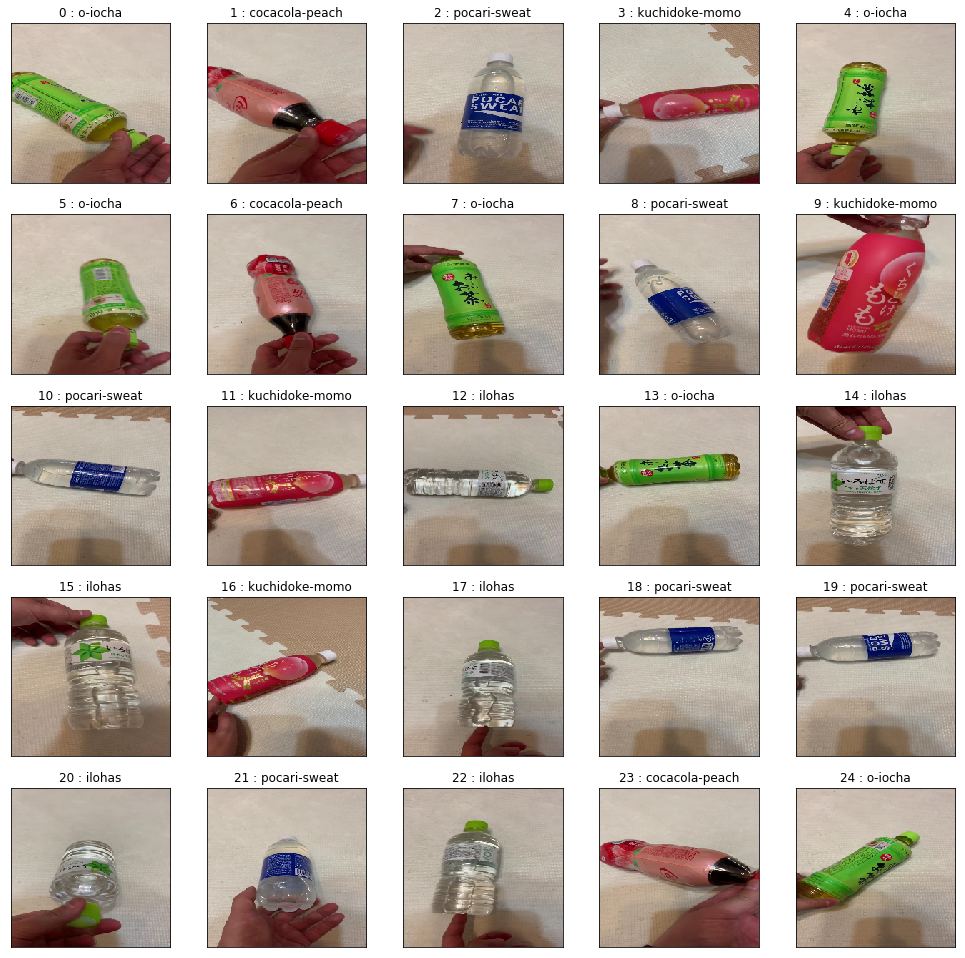

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import os,random
from keras.preprocessing.image import img_to_array, load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.models import load_model
%matplotlib inline

batch_size=32
file_name='MobileNetV2_shape224'
test_dir = './images/test2'
display_dir = './images/display2'
label = ['cocacola-peach', 'ilohas', 'kuchidoke-momo','o-iocha','pocari-sweat']

#load model and weights
model = load_model(file_name+'.h5')

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#data generate
test_datagen=ImageDataGenerator(rescale=1.0/255)

test_generator=test_datagen.flow_from_directory(
    test_dir,
    target_size=(224,224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

#evaluate model
score = model.evaluate_generator(test_generator, steps=10)
print('\n test loss:',score[0])
print('\n test_acc:',score[1])

#predict model and display images
files=os.listdir(display_dir)
img=random.sample(files,25)

plt.figure(figsize=(17,17))
for i in range(25):
    temp_img=load_img(os.path.join(display_dir,img[i]),target_size=(224,224))
    plt.subplot(5,5,i+1)
    plt.imshow(temp_img)
    #Images normalization
    temp_img_array=img_to_array(temp_img)
    temp_img_array=temp_img_array.astype('float32')/255.0
    temp_img_array=temp_img_array.reshape((1,224,224,3))
    #predict image
    img_pred=model.predict(temp_img_array)
    print('img_pred     :    ', i,'   ',(img_pred*100).astype(np.int))
    plt.title(str(i)+' : '+label[np.argmax(img_pred)])
    #eliminate xticks,yticks
    plt.xticks([]),plt.yticks([])

plt.show()

# MobileNetV2（160×160）

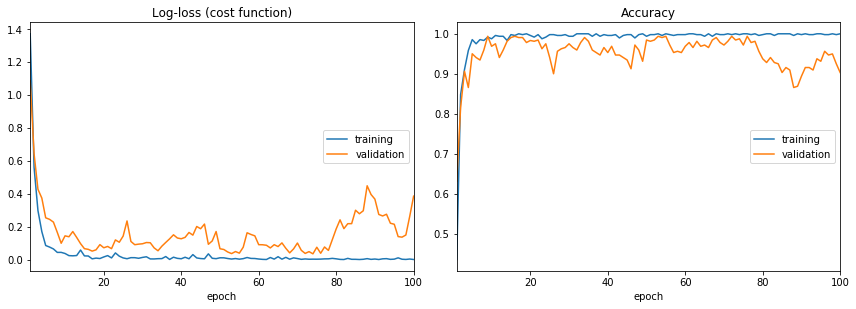

Log-loss (cost function):
training   (min:    0.001, max:    1.370, cur:    0.001)
validation (min:    0.035, max:    1.086, cur:    0.385)

Accuracy:
training   (min:    0.435, max:    1.000, cur:    1.000)
validation (min:    0.631, max:    0.994, cur:    0.903)


In [1]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D,Input,Dropout
from keras.applications.mobilenet import MobileNet
from keras.applications.mobilenetv2 import MobileNetV2
from keras.applications.vgg16 import VGG16
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.callbacks import CSVLogger,EarlyStopping
from livelossplot.keras import PlotLossesCallback
%matplotlib inline

n_categories=5
batch_size=32
train_dir = './images/train'
validation_dir = './images/val'
file_name='MobileNetV2_shape160'

base_model=MobileNetV2(input_shape=(160,160,3),
                       weights='imagenet',
                       include_top=False)

#add new layers instead of FC networks
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dropout(0.5)(x)
x=Dense(1024,activation='relu')(x)
prediction=Dense(n_categories,activation='softmax')(x)
model=Model(inputs=base_model.input,outputs=prediction)

#fix weights before MobileNet
for layer in base_model.layers[:85]:
    layer.trainable=False

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

#save model
train_datagen=ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    rescale=1.0/255,
    shear_range=0.2,
    zoom_range=0.2,
    vertical_flip=True,
    horizontal_flip=True)

validation_datagen=ImageDataGenerator(rescale=1.0/255)

train_generator=train_datagen.flow_from_directory(
    train_dir,
    target_size=(160,160),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

validation_generator=validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(160,160),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

hist=model.fit_generator(train_generator,
                         steps_per_epoch=15,
                         epochs=100,
                         verbose=1,
                         validation_data=validation_generator,
                         validation_steps=10,
                         #callbacks=[EarlyStopping(patience=2),PlotLossesCallback()]
                         callbacks=[PlotLossesCallback()]
                        )

#save weights
model.save(file_name+'.h5')

Found 435 images belonging to 5 classes.

 test loss: 0.0448226616717875

 test_acc: 0.990625
img_pred     :     0     [[ 0 99  0  0  0]]
img_pred     :     1     [[ 0 99  0  0  0]]
img_pred     :     2     [[ 0  0 99  0  0]]
img_pred     :     3     [[ 0  0  0 99  0]]
img_pred     :     4     [[ 0  0  0  0 99]]
img_pred     :     5     [[ 0  0  0  0 99]]
img_pred     :     6     [[67  0  5  4 21]]
img_pred     :     7     [[ 0 99  0  0  0]]
img_pred     :     8     [[ 0  0  0 99  0]]
img_pred     :     9     [[ 0 99  0  0  0]]
img_pred     :     10     [[ 0  0 99  0  0]]
img_pred     :     11     [[87  0  1  1  9]]
img_pred     :     12     [[ 0  0  0  0 99]]
img_pred     :     13     [[ 0 99  0  0  0]]
img_pred     :     14     [[ 0  0  0 99  0]]
img_pred     :     15     [[ 0  0 99  0  0]]
img_pred     :     16     [[ 0  0  0  0 99]]
img_pred     :     17     [[ 0 99  0  0  0]]
img_pred     :     18     [[ 0  0  0  0 99]]
img_pred     :     19     [[ 0  0  0  0 99]]
img_pred     :  

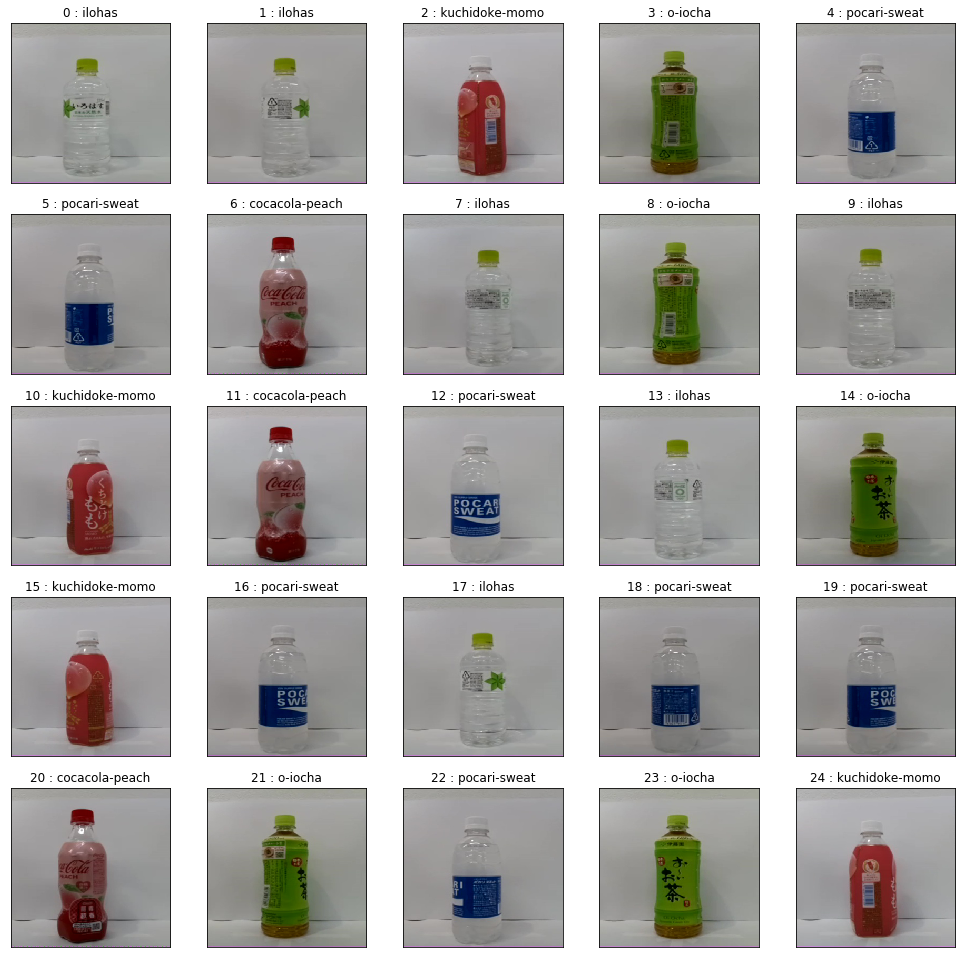

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os,random
from keras.preprocessing.image import img_to_array, load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.models import load_model
%matplotlib inline

batch_size=32
file_name='MobileNetV2_shape160'
test_dir = './images/test'
display_dir = './images/display'
label = ['cocacola-peach', 'ilohas', 'kuchidoke-momo','o-iocha','pocari-sweat']

#load model and weights
model = load_model(file_name+'.h5')

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#data generate
test_datagen=ImageDataGenerator(rescale=1.0/255)

test_generator=test_datagen.flow_from_directory(
    test_dir,
    target_size=(160,160),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

#evaluate model
score = model.evaluate_generator(test_generator, steps=10)
print('\n test loss:',score[0])
print('\n test_acc:',score[1])

#predict model and display images
files=os.listdir(display_dir)
img=random.sample(files,25)

plt.figure(figsize=(17,17))
for i in range(25):
    temp_img=load_img(os.path.join(display_dir,img[i]),target_size=(160,160))
    plt.subplot(5,5,i+1)
    plt.imshow(temp_img)
    #Images normalization
    temp_img_array=img_to_array(temp_img)
    temp_img_array=temp_img_array.astype('float32')/255.0
    temp_img_array=temp_img_array.reshape((1,160,160,3))
    #predict image
    img_pred=model.predict(temp_img_array)
    print('img_pred     :    ', i,'   ',(img_pred*100).astype(np.int))
    plt.title(str(i)+' : '+label[np.argmax(img_pred)])
    #eliminate xticks,yticks
    plt.xticks([]),plt.yticks([])

plt.show()

Found 340 images belonging to 5 classes.

 test loss: 0.4968989446759224

 test_acc: 0.875
img_pred     :     0     [[ 0  0  0 99  0]]
img_pred     :     1     [[51 21 22  1  2]]
img_pred     :     2     [[ 0  0  0 99  0]]
img_pred     :     3     [[ 0  1  0  0 98]]
img_pred     :     4     [[ 0 92  5  0  1]]
img_pred     :     5     [[ 0  0  0 99  0]]
img_pred     :     6     [[ 0  0 99  0  0]]
img_pred     :     7     [[ 0 99  0  0  0]]
img_pred     :     8     [[ 0  0  0 99  0]]
img_pred     :     9     [[ 0  1  0 98  0]]
img_pred     :     10     [[ 0  0  0 99  0]]
img_pred     :     11     [[ 0  1  1  0 97]]
img_pred     :     12     [[ 0  0  0 99  0]]
img_pred     :     13     [[ 0  0 99  0  0]]
img_pred     :     14     [[ 0  0  0 99  0]]
img_pred     :     15     [[ 0 99  0  0  0]]
img_pred     :     16     [[ 0  0 99  0  0]]
img_pred     :     17     [[ 0  0  0 99  0]]
img_pred     :     18     [[ 0  1  0  0 98]]
img_pred     :     19     [[ 0 99  0  0  0]]
img_pred     :     

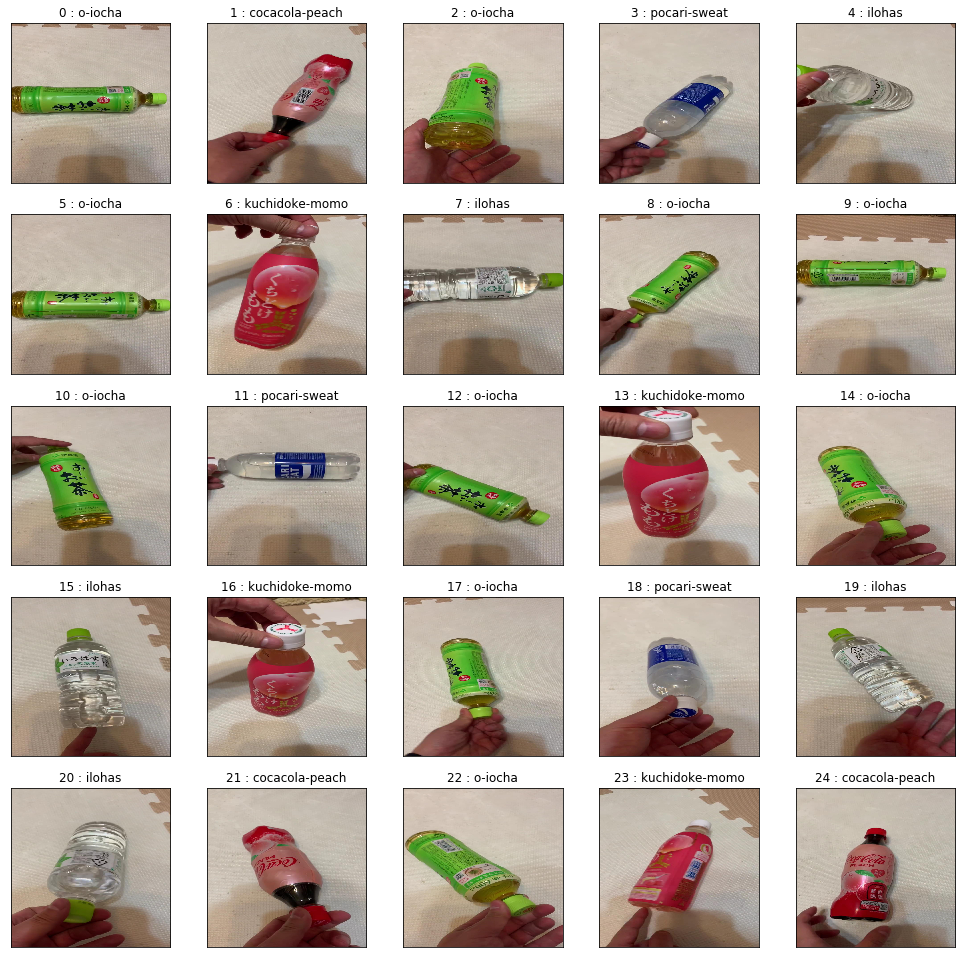

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import os,random
from keras.preprocessing.image import img_to_array, load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.models import load_model
%matplotlib inline

batch_size=32
file_name='MobileNetV2_shape160'
test_dir = './images/test2'
display_dir = './images/display2'
label = ['cocacola-peach', 'ilohas', 'kuchidoke-momo','o-iocha','pocari-sweat']

#load model and weights
model = load_model(file_name+'.h5')

model.compile(optimizer=Adam(lr=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#data generate
test_datagen=ImageDataGenerator(rescale=1.0/255)

test_generator=test_datagen.flow_from_directory(
    test_dir,
    target_size=(160,160),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

#evaluate model
score = model.evaluate_generator(test_generator, steps=10)
print('\n test loss:',score[0])
print('\n test_acc:',score[1])

#predict model and display images
files=os.listdir(display_dir)
img=random.sample(files,25)

plt.figure(figsize=(17,17))
for i in range(25):
    temp_img=load_img(os.path.join(display_dir,img[i]),target_size=(160,160))
    plt.subplot(5,5,i+1)
    plt.imshow(temp_img)
    #Images normalization
    temp_img_array=img_to_array(temp_img)
    temp_img_array=temp_img_array.astype('float32')/255.0
    temp_img_array=temp_img_array.reshape((1,160,160,3))
    #predict image
    img_pred=model.predict(temp_img_array)
    print('img_pred     :    ', i,'   ',(img_pred*100).astype(np.int))
    plt.title(str(i)+' : '+label[np.argmax(img_pred)])
    #eliminate xticks,yticks
    plt.xticks([]),plt.yticks([])

plt.show()